DATASET INFORMATION
Dataset shape: (1456, 9)
Target variable: Cylinder compressive strength (MPa)
Number of input variables: 8
Input variables:
 1.  Cement(kg/m3)
 2.  Water(kg/m3)
 3. Coarse aggregate(kg/m3)
 4. Fine aggregate(kg/m3)
 5.  FA (kg/m3)
 6. SF (kg/m3)
 7. GGBFS (kg/m3)
 8. SP (kg/m3)

Missing values in input variables: 0
Missing values in target: 0

Resolved SCM feature names:
  GGBFS: None
  FA: None
  SF: None
Resolved interaction pair: [None, None]

TRAIN-TEST SPLIT
Training samples: 1164
Testing samples:  292
Training fraction: 0.799
Testing fraction:  0.201

TRAINING CATBOOST REGRESSOR (MOWCA-TUNED)
CatBoost training completed.

Model parameters:
learning_rate: 0.20187322
depth: 6
l2_leaf_reg: 4.925521415
bagging_temperature: 0.219264541
random_strength: 2.873836707
border_count: 216
rsm: 0.520345356
iterations: 2000
random_seed: 42
thread_count: -1
verbose: False
loss_function: RMSE
eval_metric: RMSE

MODEL PERFORMANCE
              R2    RMSE     MAE  MAPE (%)
Trai

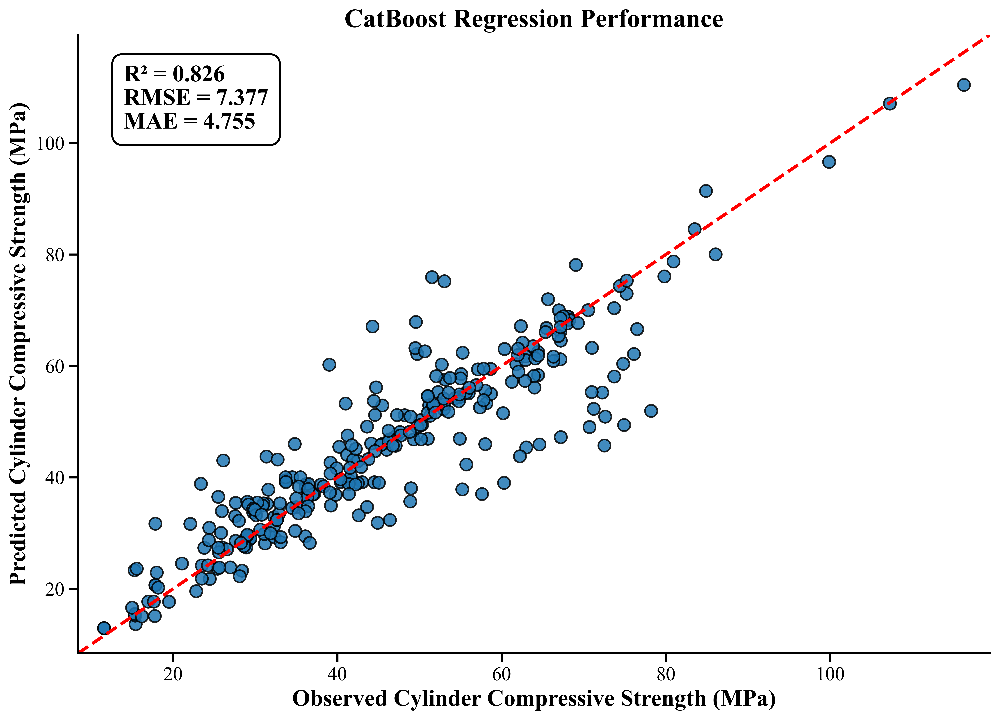


CATBOOST FEATURE IMPORTANCE
                Feature  Importance  Rank
          Cement(kg/m3)   22.092603     1
           Water(kg/m3)   21.298349     2
             SP (kg/m3)   11.611549     3
  Fine aggregate(kg/m3)   11.113295     4
Coarse aggregate(kg/m3)   10.800735     5
             FA (kg/m3)    9.550101     6
             SF (kg/m3)    7.003589     7
          GGBFS (kg/m3)    6.529780     8

CALCULATING SHAP VALUES
Observations explained by SHAP: 292
Number of features explained: 8
SHAP matrix shape: (292, 8)

SHAP FEATURE IMPORTANCE
                Feature  Mean_Absolute_SHAP  Mean_SHAP  Rank
          Cement(kg/m3)            7.401850  -0.736753     1
           Water(kg/m3)            6.160724  -0.487665     2
             SF (kg/m3)            3.153922  -0.260617     3
          GGBFS (kg/m3)            2.963488   0.394221     4
             SP (kg/m3)            2.261336  -0.066625     5
Coarse aggregate(kg/m3)            2.198018  -0.160533     6
  Fine aggregate(kg/

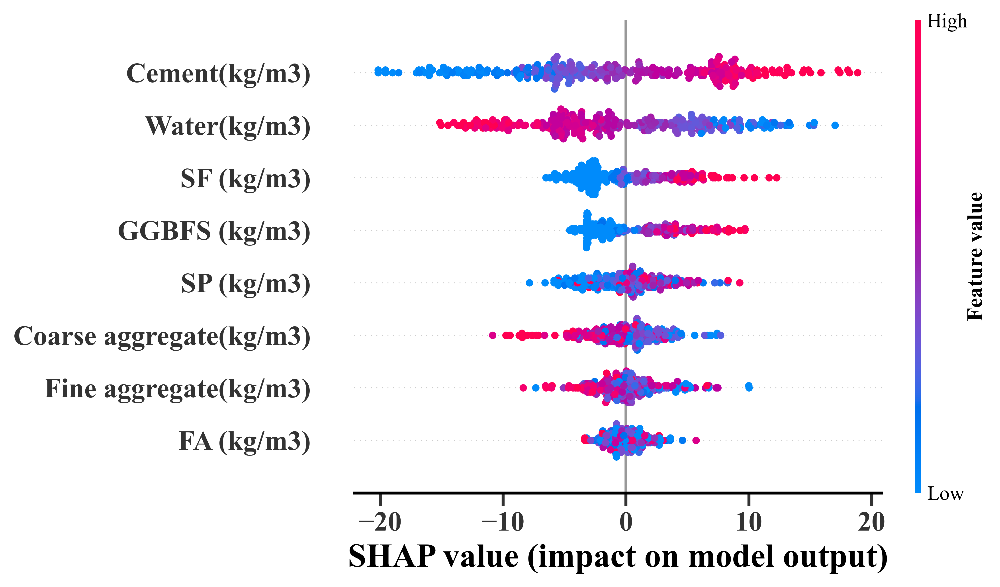

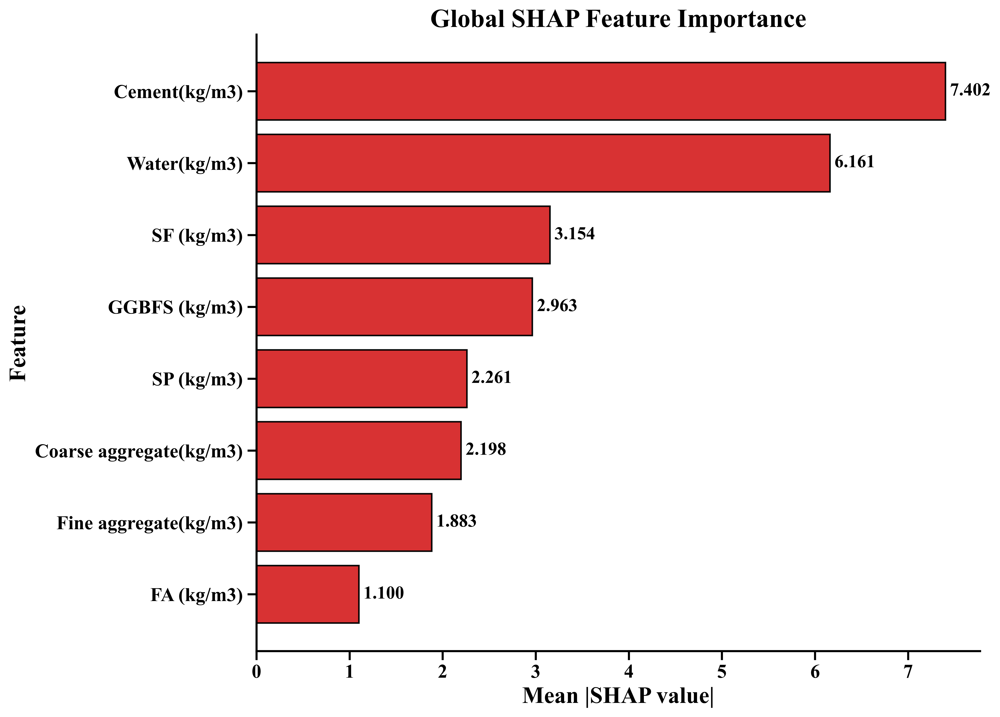


Features selected for dependence plots:
-  Cement(kg/m3)
-  Water(kg/m3)
- SF (kg/m3)
- GGBFS (kg/m3)
- SP (kg/m3)
- Coarse aggregate(kg/m3)
- Fine aggregate(kg/m3)
-  FA (kg/m3)


<Figure size 6600x4800 with 0 Axes>

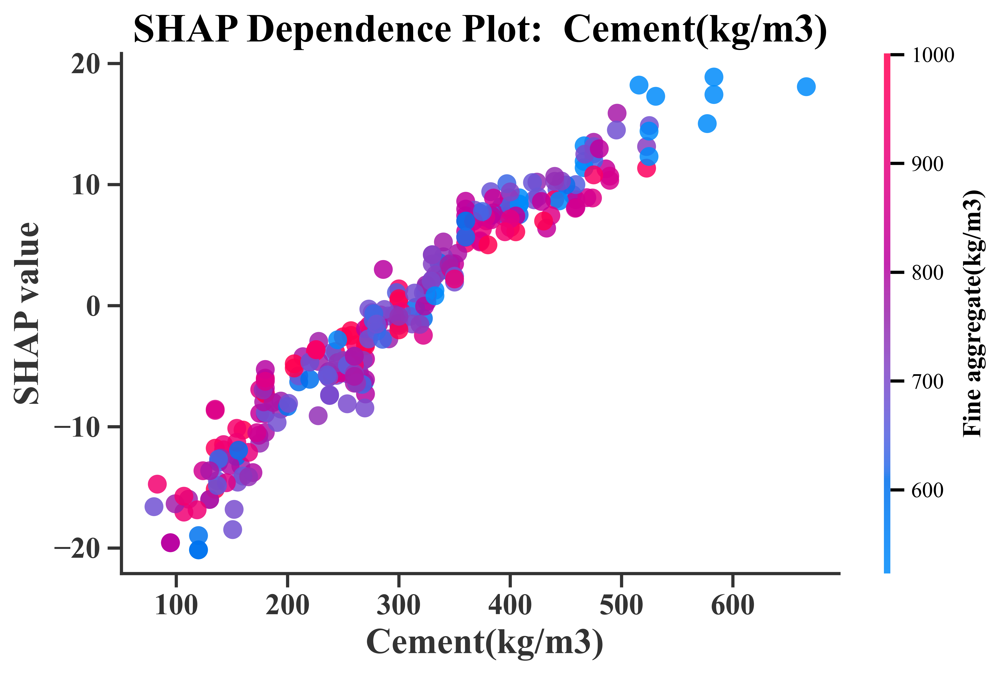

<Figure size 6600x4800 with 0 Axes>

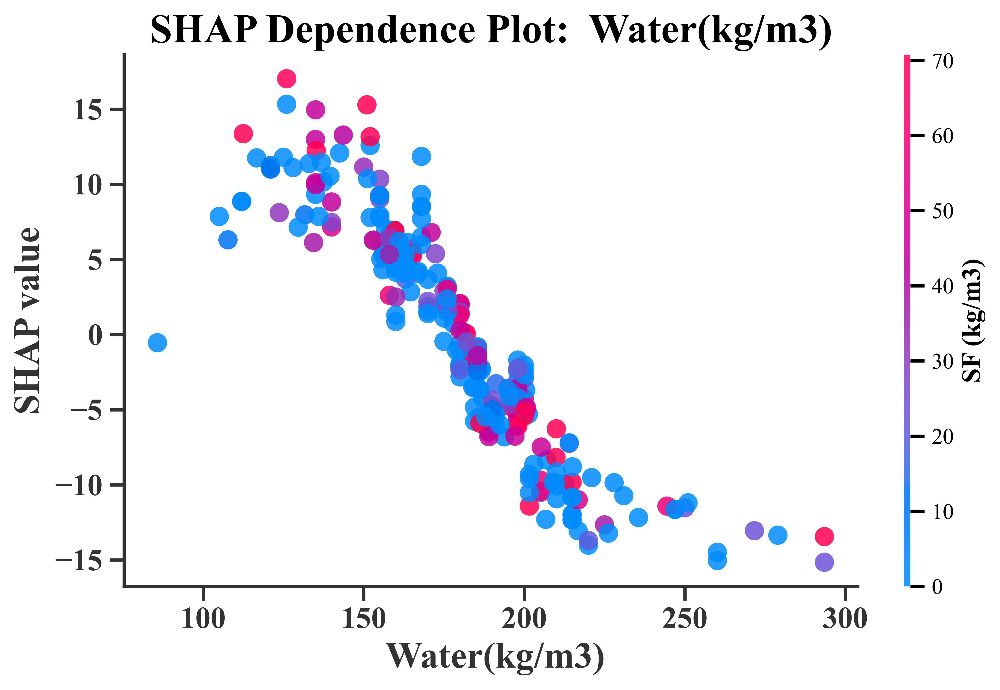

<Figure size 6600x4800 with 0 Axes>

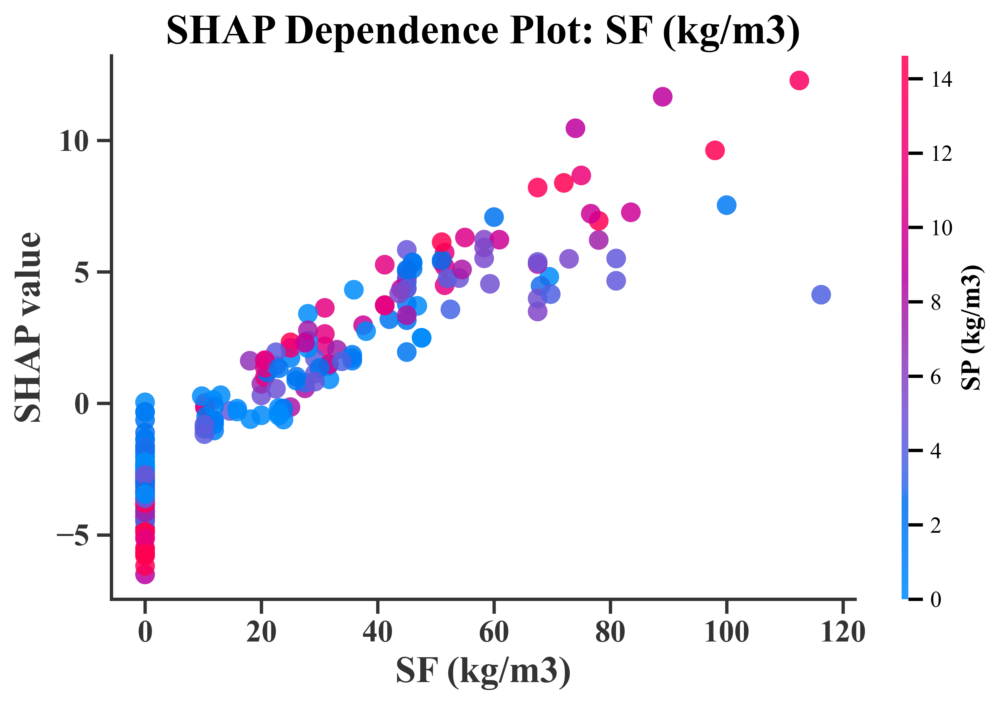

<Figure size 6600x4800 with 0 Axes>

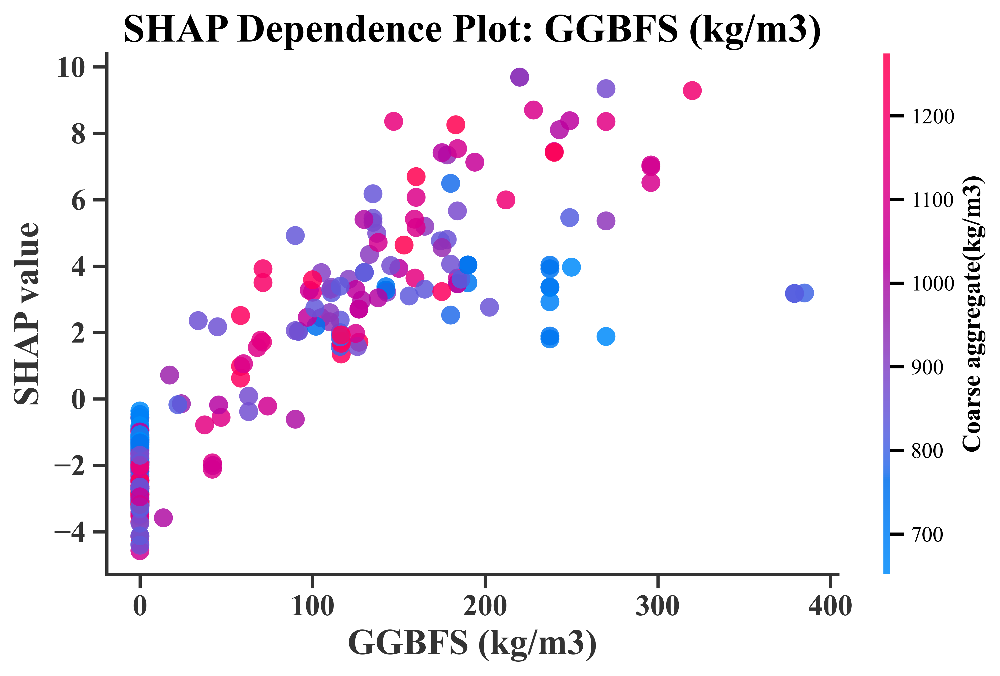

<Figure size 6600x4800 with 0 Axes>

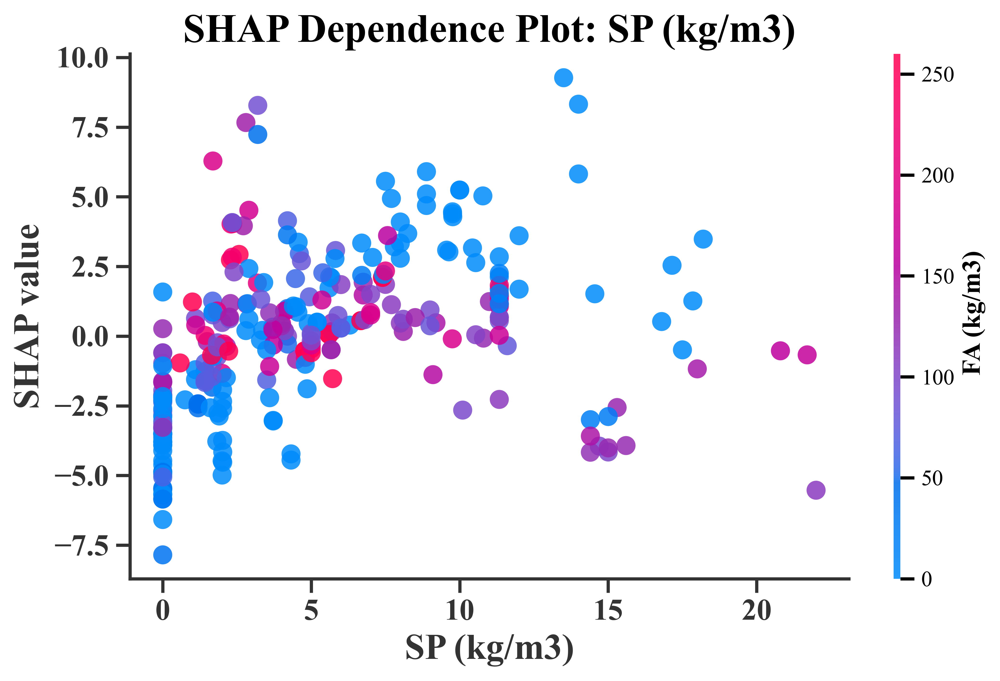

<Figure size 6600x4800 with 0 Axes>

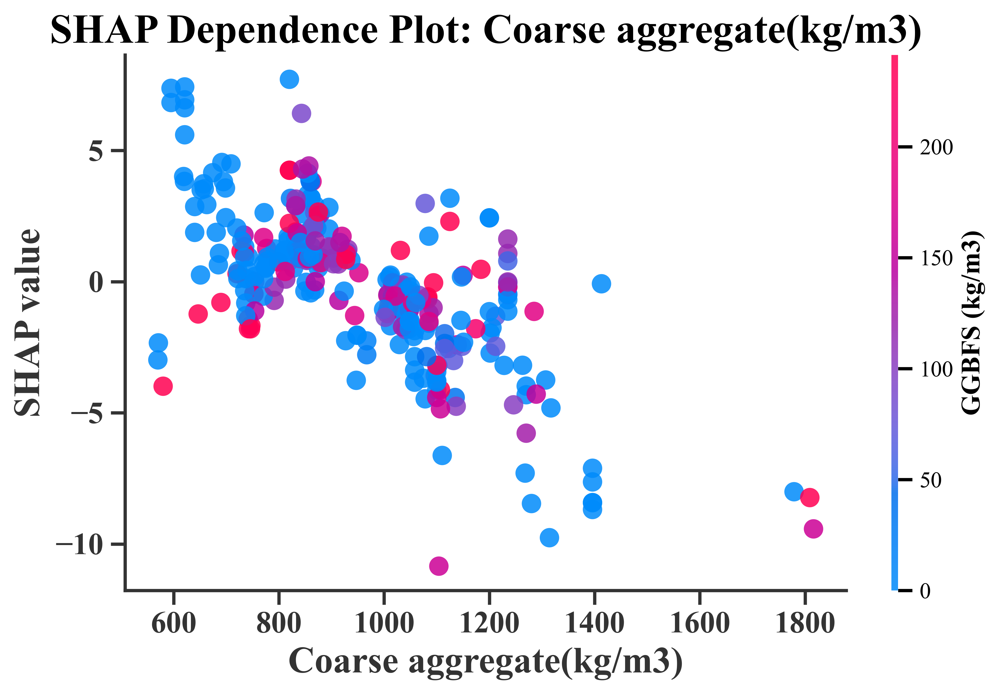

<Figure size 6600x4800 with 0 Axes>

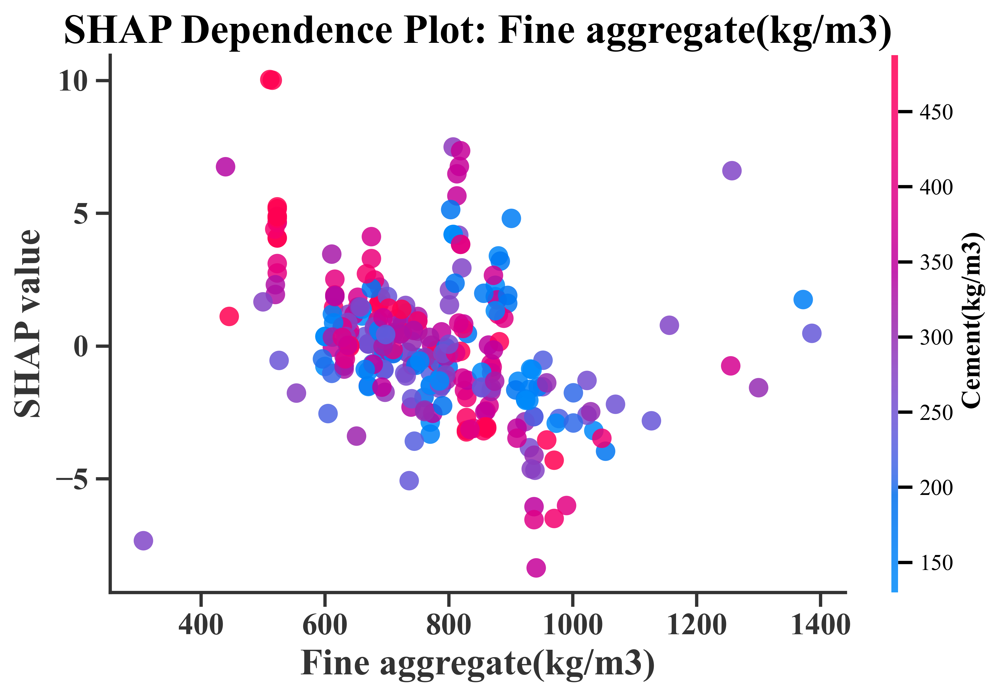

<Figure size 6600x4800 with 0 Axes>

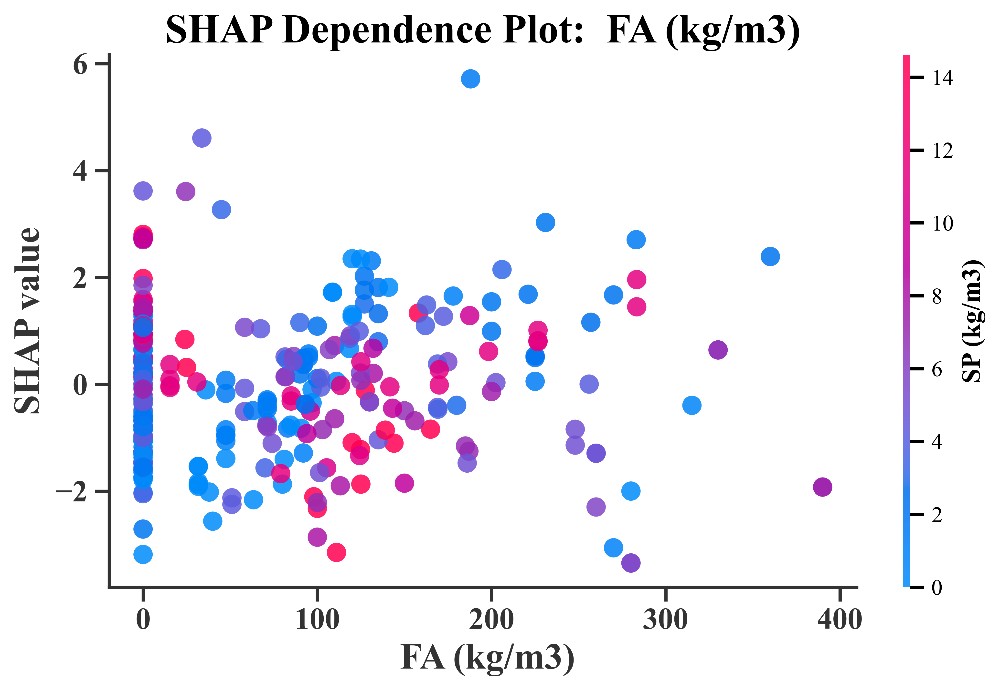

findfont: Font family ['cmsy10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmr10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmtt10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmmi10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmb10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmss10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmex10'] not found. Falling back to DejaVu Sans.


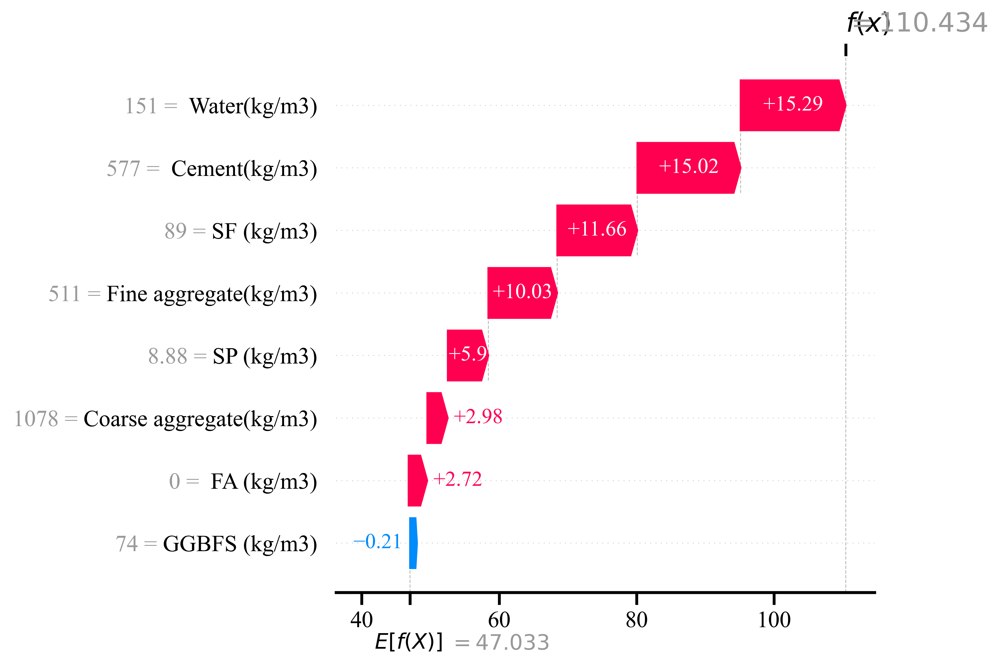


Waterfall observation position in SHAP sample: 105


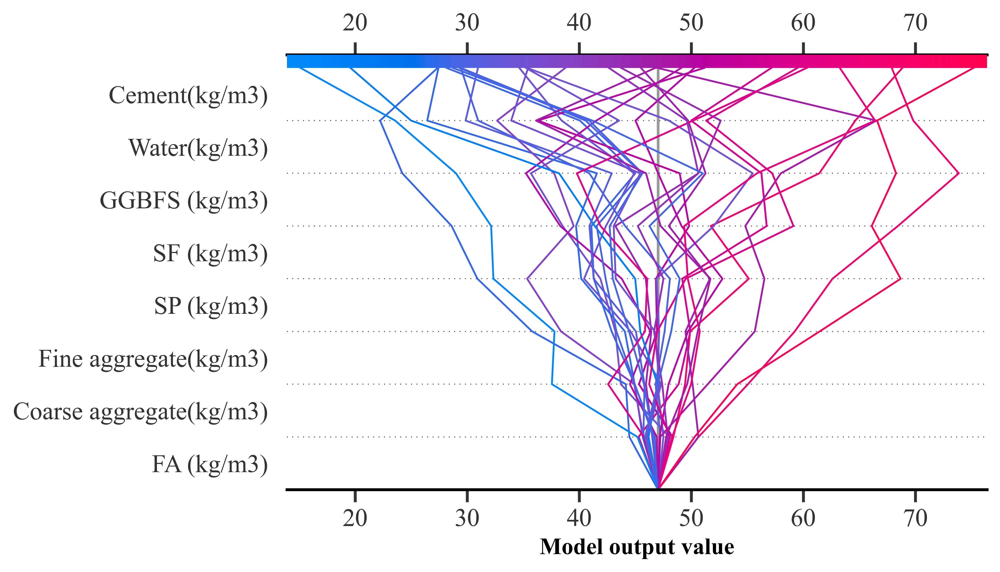

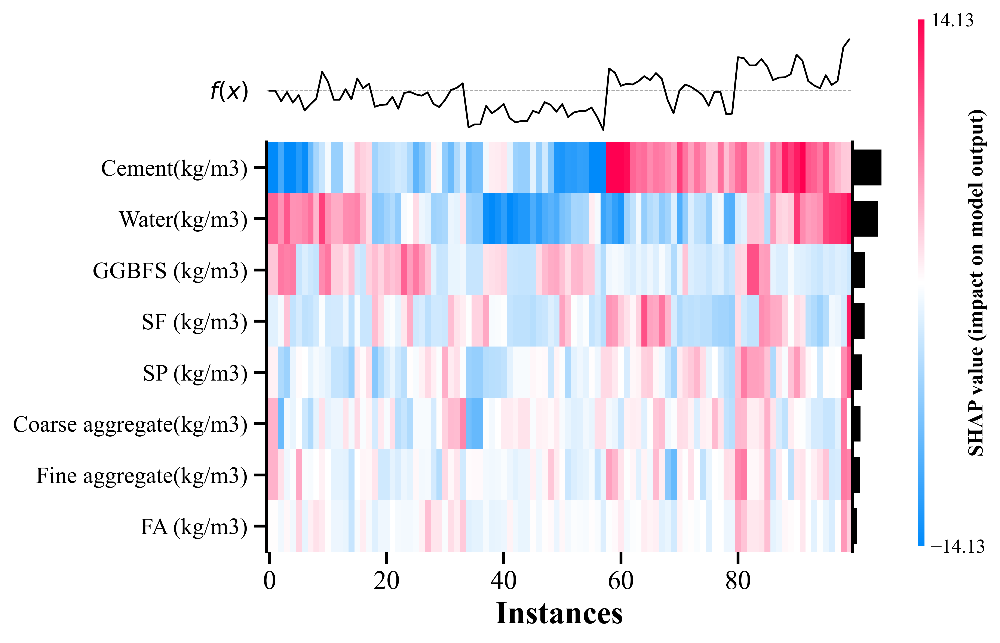


REVIEWER Q1: SHAP INTERACTION — w/c ratio x Cement content
Could not resolve w/c ratio and/or cement feature names. Available columns:
 Cement(kg/m3)
 Water(kg/m3)
Coarse aggregate(kg/m3)
Fine aggregate(kg/m3)
 FA (kg/m3)
SF (kg/m3)
GGBFS (kg/m3)
SP (kg/m3)

REVIEWER Q2/Q3: SCM DEPENDENCE BEHAVIOUR (GGBFS, FA, SF)
[GGBFS] Feature not found in dataset.
[FA] Feature not found in dataset.
[SF] Feature not found in dataset.

ANALYSIS COMPLETED
Results saved to:
C:\Users\suhai\Desktop\SHAP SCM

Main publication figures:
1. Observed vs Predicted
2. SHAP Summary Dot Plot
3. SHAP Global Importance
4. SHAP Dependence Plots (all features, in Dependence_Plots/)
5. SHAP Waterfall
6. SHAP Decision Plot
7. SHAP Heatmap
8. SHAP Interaction Heatmap (if Q1 computed)
9. SHAP Interaction Scatter (if Q1 computed)

Reviewer question outputs:
- Interaction_Analysis/  (Q1)
- Reviewer_Questions/    (Q2, Q3, binned summaries)

Top SHAP features:
 Rank                 Feature  Mean_Absolute_SHAP  Mean_SHAP
   

In [1]:
import os
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from catboost import CatBoostRegressor
import shap

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
)

warnings.filterwarnings("ignore")

# ============================================================
# 1. SETTINGS
# ============================================================

DATA_PATH = r"D:\2026 Work\My Papers\SCM-based concrete\Modelling of the data\Data\Data.csv"

TARGET = "Cylinder compressive strength (MPa)"

TEST_SIZE = 0.20
RANDOM_STATE = 42

# CatBoost settings — MOWCA-optimized hyperparameters
CATBOOST_PARAMS = {
    "learning_rate": 0.20187322,
    "depth": 6,
    "l2_leaf_reg": 4.925521415,
    "bagging_temperature": 0.219264541,
    "random_strength": 2.873836707,
    "border_count": 216,
    "rsm": 0.520345356,
    "iterations": 2000,
    "random_seed": RANDOM_STATE,
    "thread_count": -1,
    "verbose": False,
    "loss_function": "RMSE",
    "eval_metric": "RMSE",
}

# Number of test observations used for SHAP.
MAX_SHAP_SAMPLES = None   # None = use the complete test set

# Number of top features shown in publication plots
MAX_DISPLAY = 15

# Dependence plots: None = automatically all features with non-zero SHAP
DEPENDENCE_FEATURES = None

# Interaction features for reviewer question (w/c ratio x cement content)
INTERACTION_PAIR = ("w/c ratio", "Cement content")

# Candidate names for the three SCM features (case-insensitive matching)
SCM_FEATURES = {
    "GGBFS": ["ggbfs", "ggbs", "slag", "ground granulated blast furnace slag"],
    "FA": ["fa", "fly ash", "flyash", "class f fly ash", "class c fly ash"],
    "SF": ["sf", "silica fume", "silica fume (kg/m3)", "silica fume content"],
}

# Publication figure settings
DPI = 600
FIG_WIDTH = 11
FIG_HEIGHT = 8
FONT = "Times New Roman"

# Output directory
OUTPUT_DIR = Path(r"C:\Users\suhai\Desktop\SHAP SCM")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
INTERACTION_DIR = OUTPUT_DIR / "Interaction_Analysis"
INTERACTION_DIR.mkdir(parents=True, exist_ok=True)
REVIEWER_DIR = OUTPUT_DIR / "Reviewer_Questions"
REVIEWER_DIR.mkdir(parents=True, exist_ok=True)


# ============================================================
# 2. PUBLICATION PLOT SETTINGS
# ============================================================

plt.rcParams["font.family"] = FONT
plt.rcParams["font.size"] = 16
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.labelsize"] = 18
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["axes.linewidth"] = 1.6
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["axes.titleweight"] = "bold"
plt.rcParams["xtick.major.width"] = 1.6
plt.rcParams["ytick.major.width"] = 1.6
plt.rcParams["xtick.major.size"] = 7
plt.rcParams["ytick.major.size"] = 7
plt.rcParams["savefig.dpi"] = DPI
plt.rcParams["figure.dpi"] = DPI


# ============================================================
# 3. LOAD DATA
# ============================================================

if not os.path.exists(DATA_PATH):
    raise FileNotFoundError(
        f"Dataset not found:\n{DATA_PATH}\n\n"
        "Please update DATA_PATH in Section 1."
    )

df = pd.read_csv(DATA_PATH)

print("=" * 70)
print("DATASET INFORMATION")
print("=" * 70)
print(f"Dataset shape: {df.shape}")
print(f"Target variable: {TARGET}")

if TARGET not in df.columns:
    raise ValueError(
        f"Target column '{TARGET}' was not found.\n"
        f"Available columns:\n{list(df.columns)}"
    )

initial_rows = len(df)
df = df.dropna(subset=[TARGET]).copy()
removed_target_rows = initial_rows - len(df)
if removed_target_rows > 0:
    print(f"Rows removed because of missing target: {removed_target_rows}")


# ============================================================
# 4. DEFINE INPUT VARIABLES AND TARGET
# ============================================================

X = df.drop(columns=[TARGET]).copy()
y = df[TARGET].copy()

for col in X.columns:
    if X[col].dtype == bool:
        X[col] = X[col].astype(int)

non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns.tolist()
if non_numeric_columns:
    raise TypeError(
        "Non-numeric input variables were found:\n"
        f"{non_numeric_columns}\n\n"
        "This script is configured for a numerical regression dataset."
    )

print(f"Number of input variables: {X.shape[1]}")
print("Input variables:")
for i, col in enumerate(X.columns, start=1):
    print(f"{i:2d}. {col}")

print(f"\nMissing values in input variables: {X.isna().sum().sum()}")
print(f"Missing values in target: {y.isna().sum()}")


# ============================================================
# 4b. RESOLVE SCM FEATURE NAMES (case-insensitive)
# ============================================================

def find_feature(candidates, columns):
    lower_map = {c.lower(): c for c in columns}
    for cand in candidates:
        if cand in lower_map:
            return lower_map[cand]
    return None

resolved_scm = {}
for key, cands in SCM_FEATURES.items():
    resolved_scm[key] = find_feature(cands, X.columns)

print("\nResolved SCM feature names:")
for k, v in resolved_scm.items():
    print(f"  {k}: {v}")

# Resolve interaction pair
def resolve_single(name, columns):
    lower_map = {c.lower(): c for c in columns}
    return lower_map.get(name.lower(), None)

interaction_resolved = [
    resolve_single(INTERACTION_PAIR[0], X.columns),
    resolve_single(INTERACTION_PAIR[1], X.columns),
]
print(f"Resolved interaction pair: {interaction_resolved}")


# ============================================================
# 5. FIXED 80/20 TRAIN-TEST SPLIT
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
)

print("\n" + "=" * 70)
print("TRAIN-TEST SPLIT")
print("=" * 70)
print(f"Training samples: {len(X_train)}")
print(f"Testing samples:  {len(X_test)}")
print(f"Training fraction: {len(X_train) / len(X):.3f}")
print(f"Testing fraction:  {len(X_test) / len(X):.3f}")


# ============================================================
# 6. TRAIN CATBOOST REGRESSOR
# ============================================================

print("\n" + "=" * 70)
print("TRAINING CATBOOST REGRESSOR (MOWCA-TUNED)")
print("=" * 70)

model = CatBoostRegressor(**CATBOOST_PARAMS)
model.fit(X_train, y_train)

print("CatBoost training completed.")
print("\nModel parameters:")
for key, value in CATBOOST_PARAMS.items():
    print(f"{key}: {value}")


# ============================================================
# 7. PREDICTIONS AND MODEL PERFORMANCE
# ============================================================

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    nonzero = np.asarray(y_true) != 0
    if np.any(nonzero):
        mape = (
            mean_absolute_percentage_error(
                np.asarray(y_true)[nonzero],
                np.asarray(y_pred)[nonzero],
            ) * 100
        )
    else:
        mape = np.nan
    return {"R2": r2, "RMSE": rmse, "MAE": mae, "MAPE (%)": mape}


train_metrics = calculate_metrics(y_train, y_train_pred)
test_metrics = calculate_metrics(y_test, y_test_pred)

metrics_df = pd.DataFrame(
    [train_metrics, test_metrics],
    index=["Training", "Testing"],
)

metrics_df.to_csv(OUTPUT_DIR / "CatBoost_Performance.csv", index=True)

print("\n" + "=" * 70)
print("MODEL PERFORMANCE")
print("=" * 70)
print(metrics_df.round(4).to_string())


# ============================================================
# 8. PREDICTED VS OBSERVED PLOT
# ============================================================

all_values = np.concatenate([np.asarray(y_test), np.asarray(y_test_pred)])
plot_min = np.min(all_values)
plot_max = np.max(all_values)
margin = 0.03 * (plot_max - plot_min)
plot_min -= margin
plot_max += margin

fig, ax = plt.subplots(figsize=(FIG_WIDTH, FIG_HEIGHT))
ax.scatter(
    y_test, y_test_pred,
    s=90, alpha=0.85, edgecolors="black",
    linewidths=1.2, color="#1f77b4",
)
ax.plot(
    [plot_min, plot_max], [plot_min, plot_max],
    linestyle="--", linewidth=2.5, color="red",
)
ax.set_xlim(plot_min, plot_max)
ax.set_ylim(plot_min, plot_max)
ax.set_xlabel("Observed Cylinder Compressive Strength (MPa)")
ax.set_ylabel("Predicted Cylinder Compressive Strength (MPa)")
ax.set_title("CatBoost Regression Performance")

ax.text(
    0.05, 0.95,
    f"R² = {test_metrics['R2']:.3f}\n"
    f"RMSE = {test_metrics['RMSE']:.3f}\n"
    f"MAE = {test_metrics['MAE']:.3f}",
    transform=ax.transAxes,
    verticalalignment="top",
    fontsize=18, fontweight="bold",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white",
              edgecolor="black", linewidth=1.5),
)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_1_Observed_vs_Predicted.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_1_Observed_vs_Predicted.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)


# ============================================================
# 9. CATBOOST BUILT-IN FEATURE IMPORTANCE
# ============================================================

catboost_importance = pd.DataFrame(
    {"Feature": X.columns, "Importance": model.get_feature_importance()}
).sort_values("Importance", ascending=False)
catboost_importance["Rank"] = np.arange(1, len(catboost_importance) + 1)
catboost_importance.to_csv(OUTPUT_DIR / "CatBoost_Feature_Importance.csv", index=False)

print("\n" + "=" * 70)
print("CATBOOST FEATURE IMPORTANCE")
print("=" * 70)
print(catboost_importance.to_string(index=False))


# ============================================================
# 10. SHAP EXPLAINER
# ============================================================

print("\n" + "=" * 70)
print("CALCULATING SHAP VALUES")
print("=" * 70)

explainer = shap.TreeExplainer(model)

if MAX_SHAP_SAMPLES is None:
    X_shap = X_test.copy()
else:
    n_samples = min(MAX_SHAP_SAMPLES, len(X_test))
    X_shap = X_test.sample(n=n_samples, random_state=RANDOM_STATE)

shap_values = explainer(X_shap)

print(f"Observations explained by SHAP: {len(X_shap)}")
print(f"Number of features explained: {X_shap.shape[1]}")

if not isinstance(shap_values, shap.Explanation):
    shap_values = shap.Explanation(
        values=np.asarray(shap_values),
        base_values=explainer.expected_value,
        data=X_shap.values,
        feature_names=X_shap.columns.tolist(),
    )

shap_array = np.asarray(shap_values.values)
if shap_array.ndim == 3:
    shap_array = shap_array[:, :, 0]

print(f"SHAP matrix shape: {shap_array.shape}")


# ============================================================
# 11. SHAP GLOBAL IMPORTANCE TABLE
# ============================================================

mean_abs_shap = np.abs(shap_array).mean(axis=0)
mean_shap = shap_array.mean(axis=0)

shap_importance = pd.DataFrame({
    "Feature": X_shap.columns,
    "Mean_Absolute_SHAP": mean_abs_shap,
    "Mean_SHAP": mean_shap,
}).sort_values("Mean_Absolute_SHAP", ascending=False)
shap_importance["Rank"] = np.arange(1, len(shap_importance) + 1)
shap_importance.to_csv(OUTPUT_DIR / "SHAP_Feature_Importance.csv", index=False)

print("\n" + "=" * 70)
print("SHAP FEATURE IMPORTANCE")
print("=" * 70)
print(shap_importance.round(6).to_string(index=False))


# ============================================================
# 12. SHAP SUMMARY DOT PLOT
# ============================================================

plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT))
shap.summary_plot(shap_values, X_shap, plot_type="dot",
                  max_display=MAX_DISPLAY, show=False)
ax = plt.gca()
ax.set_xlabel("SHAP value (impact on model output)",
              fontsize=18, fontweight="bold", fontname=FONT)
ax.tick_params(axis="both", labelsize=15, width=1.6)
for label in ax.get_xticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
for label in ax.get_yticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig = plt.gcf()
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_2_SHAP_Summary_Dot.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_2_SHAP_Summary_Dot.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)


# ============================================================
# 13. SHAP GLOBAL BAR PLOT
# ============================================================

top_n = min(MAX_DISPLAY, len(shap_importance))
plot_df = shap_importance.head(top_n).iloc[::-1]

fig, ax = plt.subplots(figsize=(FIG_WIDTH, FIG_HEIGHT))
ax.barh(
    plot_df["Feature"], plot_df["Mean_Absolute_SHAP"],
    alpha=0.95, color="#d62728", edgecolor="black", linewidth=1.2,
)
for i, value in enumerate(plot_df["Mean_Absolute_SHAP"]):
    ax.text(value, i, f" {value:.3f}", va="center",
            fontsize=14, fontweight="bold", fontname=FONT)

ax.set_xlabel("Mean |SHAP value|", fontsize=18, fontweight="bold")
ax.set_ylabel("Feature", fontsize=18, fontweight="bold")
ax.set_title("Global SHAP Feature Importance", fontsize=20, fontweight="bold")
ax.tick_params(axis="both", labelsize=15, width=1.6)
for label in ax.get_xticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
for label in ax.get_yticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_3_SHAP_Global_Importance.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_3_SHAP_Global_Importance.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)


# ============================================================
# 14. SELECT FEATURES FOR DEPENDENCE PLOTS (ALL FEATURES)
# ============================================================

if DEPENDENCE_FEATURES is None:
    # Include ALL features with non-zero mean|SHAP|
    dependence_features = (
        shap_importance[shap_importance["Mean_Absolute_SHAP"] > 0]
        ["Feature"].tolist()
    )
else:
    missing_features = [f for f in DEPENDENCE_FEATURES if f not in X_shap.columns]
    if missing_features:
        raise ValueError(f"Dependence plot features not found: {missing_features}")
    dependence_features = DEPENDENCE_FEATURES

print("\nFeatures selected for dependence plots:")
for f in dependence_features:
    print(f"- {f}")


# ============================================================
# 15. SHAP DEPENDENCE PLOTS (ALL FEATURES)
# ============================================================

DEPENDENCE_DIR = OUTPUT_DIR / "Dependence_Plots"
DEPENDENCE_DIR.mkdir(parents=True, exist_ok=True)

for number, feature in enumerate(dependence_features, start=1):

    plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT))

    shap.dependence_plot(
        feature, shap_array, X_shap,
        interaction_index="auto",
        show=False, alpha=0.85, dot_size=90,
    )

    ax = plt.gca()
    ax.set_xlabel(feature, fontname=FONT, fontsize=18, fontweight="bold")
    ax.set_ylabel("SHAP value", fontname=FONT, fontsize=18, fontweight="bold")
    ax.set_title(f"SHAP Dependence Plot: {feature}",
                 fontname=FONT, fontsize=20, fontweight="bold")
    ax.tick_params(axis="both", labelsize=15, width=1.6)
    for label in ax.get_xticklabels():
        label.set_fontname(FONT); label.set_fontweight("bold")
    for label in ax.get_yticklabels():
        label.set_fontname(FONT); label.set_fontweight("bold")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    fig = plt.gcf()
    fig.tight_layout()

    safe_name = (str(feature).replace("/", "_").replace("\\", "_")
                 .replace(" ", "_").replace(":", "_").replace("(", "")
                 .replace(")", ""))

    fig.savefig(
        DEPENDENCE_DIR / f"Figure_4_{number:02d}_SHAP_Dependence_{safe_name}.png",
        dpi=DPI, bbox_inches="tight",
    )
    fig.savefig(
        DEPENDENCE_DIR / f"Figure_4_{number:02d}_SHAP_Dependence_{safe_name}.tiff",
        dpi=DPI, bbox_inches="tight",
    )
    plt.show()
    plt.close(fig)


# ============================================================
# 16. SHAP WATERFALL PLOT FOR ONE TEST OBSERVATION
# ============================================================

instance_index = int(np.argmax(np.abs(shap_array).sum(axis=1)))
single_explanation = shap_values[instance_index]

fig = plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT))
shap.plots.waterfall(single_explanation, max_display=MAX_DISPLAY, show=False)
ax = plt.gca()
ax.tick_params(axis="both", labelsize=15, width=1.6)
for label in ax.get_xticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
for label in ax.get_yticklabels():
    label.set_fontname(FONT); label.set_fontweight("bold")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_5_SHAP_Waterfall.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_5_SHAP_Waterfall.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)

print(f"\nWaterfall observation position in SHAP sample: {instance_index}")


# ============================================================
# 17. SHAP DECISION PLOT
# ============================================================

n_decision = min(30, len(X_shap))
fig = plt.figure(figsize=(12, 9))
shap.decision_plot(
    shap_values.base_values[0]
    if np.ndim(shap_values.base_values) > 0
    else shap_values.base_values,
    shap_array[:n_decision],
    X_shap.iloc[:n_decision],
    feature_names=X_shap.columns.tolist(),
    feature_order="importance",
    show=False,
)
ax = plt.gca()
ax.tick_params(axis="both", labelsize=14, width=1.6)
fig = plt.gcf()
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_6_SHAP_Decision_Plot.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_6_SHAP_Decision_Plot.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)


# ============================================================
# 18. SHAP HEATMAP
# ============================================================

n_heatmap = min(100, len(X_shap))
heatmap_explanation = shap_values[:n_heatmap]

plt.figure(figsize=(12, 10))
shap.plots.heatmap(heatmap_explanation, max_display=MAX_DISPLAY, show=False)
fig = plt.gcf()
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "Figure_7_SHAP_Heatmap.png", dpi=DPI, bbox_inches="tight")
fig.savefig(OUTPUT_DIR / "Figure_7_SHAP_Heatmap.tiff", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close(fig)


# ============================================================
# 19. SHAP VALUES / INPUTS / PREDICTIONS - SAVE
# ============================================================

shap_values_df = pd.DataFrame(shap_array, columns=X_shap.columns, index=X_shap.index)
shap_values_df.to_csv(OUTPUT_DIR / "SHAP_Values_Test_Set.csv")
X_shap.to_csv(OUTPUT_DIR / "SHAP_Input_Values_Test_Set.csv")

test_predictions = X_test.copy()
test_predictions["Observed"] = y_test
test_predictions["Predicted"] = y_test_pred
test_predictions["Residual"] = y_test - y_test_pred
test_predictions["Absolute_Error"] = np.abs(y_test - y_test_pred)
test_predictions.to_csv(OUTPUT_DIR / "CatBoost_Test_Predictions.csv", index=True)

model.save_model(str(OUTPUT_DIR / "CatBoost_MS_Model.cbm"))


# ============================================================
# 20. REVIEWER QUESTION 1 — SHAP INTERACTION: w/c ratio x CEMENT
# ============================================================

print("\n" + "=" * 70)
print("REVIEWER Q1: SHAP INTERACTION — w/c ratio x Cement content")
print("=" * 70)

interaction_done = False
wc_feat, cem_feat = interaction_resolved[0], interaction_resolved[1]

if wc_feat is not None and cem_feat is not None:
    try:
        # Compute SHAP interaction values
        # Subsample for tractability if needed
        n_inter = min(300, len(X_shap))
        X_inter = X_shap.iloc[:n_inter].copy()

        shap_inter = explainer.shap_interaction_values(X_inter)
        if isinstance(shap_inter, list):
            shap_inter = np.asarray(shap_inter)

        print(f"SHAP interaction matrix shape: {shap_inter.shape}")

        # Save full interaction matrix summary
        # Mean absolute interaction for each pair
        mean_abs_inter = np.abs(shap_inter).mean(axis=0)
        inter_df = pd.DataFrame(
            mean_abs_inter,
            index=X_inter.columns,
            columns=X_inter.columns,
        )
        inter_df.to_csv(INTERACTION_DIR / "SHAP_Interaction_MeanAbs_Matrix.csv")

        # Save pair values for w/c x cement
        i_wc = X_inter.columns.get_loc(wc_feat)
        i_cem = X_inter.columns.get_loc(cem_feat)
        pair_vals = shap_inter[:, i_wc, i_cem]

        pair_df = pd.DataFrame({
            wc_feat: X_inter[wc_feat].values,
            cem_feat: X_inter[cem_feat].values,
            "SHAP_interaction": pair_vals,
        })
        pair_df.to_csv(
            INTERACTION_DIR / f"SHAP_Interaction_{wc_feat}_x_{cem_feat}.csv",
            index=False,
        )

        # Interaction heatmap
        plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT))
        vmax = np.percentile(np.abs(mean_abs_inter), 99)
        im = plt.imshow(mean_abs_inter, cmap="RdBu_r",
                        vmin=-vmax, vmax=vmax, aspect="auto")
        plt.colorbar(im, label="Mean |SHAP interaction|")
        plt.xticks(range(len(X_inter.columns)), X_inter.columns,
                   rotation=90, fontsize=11)
        plt.yticks(range(len(X_inter.columns)), X_inter.columns, fontsize=11)
        plt.title("SHAP Interaction Matrix (Mean |value|)",
                  fontsize=18, fontweight="bold")
        plt.tight_layout()
        plt.savefig(INTERACTION_DIR / "Figure_8_SHAP_Interaction_Heatmap.png",
                    dpi=DPI, bbox_inches="tight")
        plt.savefig(INTERACTION_DIR / "Figure_8_SHAP_Interaction_Heatmap.tiff",
                    dpi=DPI, bbox_inches="tight")
        plt.show()
        plt.close()

        # Scatter interaction plot for the pair
        plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT))
        sc = plt.scatter(
            X_inter[wc_feat], X_inter[cem_feat],
            c=pair_vals, cmap="RdBu_r", s=90,
            edgecolors="black", linewidths=0.8, alpha=0.9,
        )
        plt.colorbar(sc, label="SHAP interaction value")
        plt.xlabel(wc_feat, fontsize=18, fontweight="bold")
        plt.ylabel(cem_feat, fontsize=18, fontweight="bold")
        plt.title(f"SHAP Interaction: {wc_feat} × {cem_feat}",
                  fontsize=20, fontweight="bold")
        plt.tight_layout()
        plt.savefig(INTERACTION_DIR / "Figure_9_SHAP_Interaction_Scatter.png",
                    dpi=DPI, bbox_inches="tight")
        plt.savefig(INTERACTION_DIR / "Figure_9_SHAP_Interaction_Scatter.tiff",
                    dpi=DPI, bbox_inches="tight")
        plt.show()
        plt.close()

        # Text summary for reviewer response
        with open(INTERACTION_DIR / "Q1_Interaction_Summary.txt", "w",
                  encoding="utf-8") as f:
            f.write("REVIEWER Q1: SHAP interaction — w/c ratio × cement content\n")
            f.write("=" * 70 + "\n\n")
            f.write(f"Features used: '{wc_feat}' × '{cem_feat}'\n")
            f.write(f"Samples used: {n_inter}\n\n")
            f.write("Mean absolute interaction value:\n")
            f.write(f"  {np.abs(pair_vals).mean():.6f}\n")
            f.write("Mean interaction value (signed):\n")
            f.write(f"  {pair_vals.mean():.6f}\n")
            f.write("Std of interaction value:\n")
            f.write(f"  {pair_vals.std():.6f}\n\n")
            f.write("Interpretation:\n")
            if np.abs(pair_vals).mean() > 0.01 * np.abs(shap_array).mean():
                f.write(
                    "  Interaction is non-trivial relative to main SHAP values.\n"
                )
            else:
                f.write(
                    "  Interaction is small relative to main SHAP values.\n"
                )
        interaction_done = True

    except Exception as e:
        print(f"Interaction computation failed: {e}")
        with open(INTERACTION_DIR / "Q1_Interaction_Summary.txt", "w",
                  encoding="utf-8") as f:
            f.write("REVIEWER Q1: SHAP interaction — w/c ratio × cement content\n")
            f.write("=" * 70 + "\n\n")
            f.write(f"Interaction computation failed with error:\n{e}\n\n")
            f.write("NOTE: This should be reported as future work.\n")
else:
    print(
        "Could not resolve w/c ratio and/or cement feature names. "
        "Available columns:\n"
        + "\n".join(X.columns)
    )
    with open(INTERACTION_DIR / "Q1_Interaction_Summary.txt", "w",
              encoding="utf-8") as f:
        f.write("REVIEWER Q1: SHAP interaction — w/c ratio × cement content\n")
        f.write("=" * 70 + "\n\n")
        f.write("Could not resolve feature names.\n")
        f.write("Please update INTERACTION_PAIR in the script.\n")
        f.write("NOTE: This should be reported as future work.\n")


# ============================================================
# 21. REVIEWER QUESTION 2 & 3 — SCM (GGBFS, FA, SF) DEPENDENCE
# ============================================================

print("\n" + "=" * 70)
print("REVIEWER Q2/Q3: SCM DEPENDENCE BEHAVIOUR (GGBFS, FA, SF)")
print("=" * 70)


def analyze_scm_dependence(feature_name, label, review_dir):
    """
    Build a SHAP dependence dataset, detect sign changes / reversal,
    and save plots + summary.
    """
    if feature_name is None or feature_name not in X_shap.columns:
        print(f"[{label}] Feature not found in dataset.")
        return None

    idx = X_shap.columns.get_loc(feature_name)
    sv = shap_array[:, idx]
    fv = X_shap[feature_name].values

    # Binned trend
    n_bins = 20
    try:
        bins = pd.qcut(fv, q=n_bins, duplicates="drop")
        bin_centers = bins.categories.mid
        bin_means = pd.Series(sv).groupby(bins, observed=True).mean().values
        bin_counts = pd.Series(sv).groupby(bins, observed=True).count().values
    except Exception:
        # Fallback to equal width
        edges = np.linspace(fv.min(), fv.max(), n_bins + 1)
        bin_centers = (edges[:-1] + edges[1:]) / 2
        bin_idx = np.digitize(fv, edges) - 1
        bin_idx = np.clip(bin_idx, 0, n_bins - 1)
        bin_means = np.array([
            sv[bin_idx == i].mean() if np.any(bin_idx == i) else np.nan
            for i in range(n_bins)
        ])
        bin_counts = np.array([
            np.sum(bin_idx == i) for i in range(n_bins)
        ])

    # Detect sign change in binned trend (drop NaNs)
    valid = ~np.isnan(bin_means)
    bm = bin_means[valid]
    bc = bin_centers[valid]
    sign_changes = np.sum(np.diff(np.sign(bm)) != 0) if len(bm) > 1 else 0

    # Reversal test: overall positive then drops?
    reversal_notes = []
    if len(bm) >= 4:
        peak_idx = int(np.nanargmax(bm))
        peak_val = bc[peak_idx]
        if peak_idx < len(bm) - 1:
            drop_after = bm[-1] - bm[peak_idx]
            if drop_after < 0:
                reversal_notes.append(
                    f"SHAP value declines after a peak near "
                    f"{feature_name} = {peak_val:.2f}; "
                    f"drop = {drop_after:.4f}."
                )
        if bm[0] > 0 and bm[-1] < bm[0]:
            reversal_notes.append(
                "Effect is positive at low dosage but declines at high dosage."
            )
        if bm[0] < 0 and bm[-1] > bm[0]:
            reversal_notes.append(
                "Effect is negative at low dosage and becomes less negative "
                "(or positive) at high dosage."
            )

    # Data range
    data_min = float(np.min(fv))
    data_max = float(np.max(fv))

    # Plot: SHAP dependence + binned mean
    fig, ax = plt.subplots(figsize=(FIG_WIDTH, FIG_HEIGHT))
    sc = ax.scatter(
        fv, sv, c=sv, cmap="coolwarm", s=90,
        edgecolors="black", linewidths=0.7, alpha=0.85,
    )
    ax.plot(
        bc, bm, color="black", linewidth=2.8,
        marker="o", markersize=9, label="Binned mean SHAP",
    )
    ax.axhline(0, color="gray", linestyle="--", linewidth=1.3)

    ax.set_xlabel(feature_name, fontsize=18, fontweight="bold")
    ax.set_ylabel("SHAP value", fontsize=18, fontweight="bold")
    ax.set_title(f"SHAP Dependence: {label} ({feature_name})",
                 fontsize=20, fontweight="bold")
    ax.tick_params(axis="both", labelsize=15, width=1.6)
    for t in ax.get_xticklabels():
        t.set_fontname(FONT); t.set_fontweight("bold")
    for t in ax.get_yticklabels():
        t.set_fontname(FONT); t.set_fontweight("bold")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(fontsize=14, frameon=True)
    plt.colorbar(sc, ax=ax, label="SHAP value")
    fig.tight_layout()

    safe = (feature_name.replace("/", "_").replace("\\", "_")
            .replace(" ", "_").replace(":", "_")
            .replace("(", "").replace(")", ""))
    fig.savefig(review_dir / f"Figure_R_{label}_Dependence_{safe}.png",
                dpi=DPI, bbox_inches="tight")
    fig.savefig(review_dir / f"Figure_R_{label}_Dependence_{safe}.tiff",
                dpi=DPI, bbox_inches="tight")
    plt.show()
    plt.close(fig)

    # Save table
    tbl = pd.DataFrame({
        "Bin_center": bc,
        "Mean_SHAP": bm,
        "Count": bin_counts[valid],
    })
    tbl.to_csv(review_dir / f"Table_R_{label}_Binned_SHAP.csv", index=False)

    # Write summary
    with open(review_dir / f"Q_{label}_Summary.txt", "w",
              encoding="utf-8") as f:
        f.write(f"REVIEWER QUESTION — {label} ({feature_name}) dependence\n")
        f.write("=" * 70 + "\n\n")
        f.write(f"Data range: {data_min:.3f} to {data_max:.3f}\n")
        f.write(f"SHAP range: {sv.min():.4f} to {sv.max():.4f}\n")
        f.write(f"Mean |SHAP|: {np.abs(sv).mean():.4f}\n")
        f.write(f"Number of sign changes in binned trend: {sign_changes}\n\n")
        f.write("Binned mean SHAP values:\n")
        f.write(tbl.round(5).to_string(index=False))
        f.write("\n\nInterpretation:\n")
        if reversal_notes:
            for note in reversal_notes:
                f.write(f"  - {note}\n")
        else:
            f.write(
                "  - No clear reversal detected: the sign of the effect "
                "is consistent across the range.\n"
            )
        f.write("\nRecommendation:\n")
        f.write(
            "  Review Figure_R_... and Table_R_... to confirm whether the "
            "effect is monotonic or reverses outside a specific range.\n"
        )

    return {
        "feature": feature_name,
        "data_min": data_min,
        "data_max": data_max,
        "mean_abs_shap": float(np.abs(sv).mean()),
        "sign_changes": int(sign_changes),
        "reversal_notes": reversal_notes,
    }


ggbfs_result = analyze_scm_dependence(
    resolved_scm["GGBFS"], "GGBFS", REVIEWER_DIR
)
fa_result = analyze_scm_dependence(
    resolved_scm["FA"], "FA", REVIEWER_DIR
)
sf_result = analyze_scm_dependence(
    resolved_scm["SF"], "SF", REVIEWER_DIR
)

# Additional SF-specific check for reversal outside ~20-80 kg/m3
if resolved_scm["SF"] is not None:
    sf_name = resolved_scm["SF"]
    sf_vals = X_shap[sf_name].values
    sf_shap = shap_array[:, X_shap.columns.get_loc(sf_name)]

    mask_20_80 = (sf_vals >= 20) & (sf_vals <= 80)
    mask_out_low = sf_vals < 20
    mask_out_high = sf_vals > 80

    def safe_mean(arr, mask):
        return float(np.mean(arr[mask])) if np.any(mask) else np.nan

    sf_inside = safe_mean(sf_shap, mask_20_80)
    sf_below = safe_mean(sf_shap, mask_out_low)
    sf_above = safe_mean(sf_shap, mask_out_high)

    with open(REVIEWER_DIR / "Q_SF_Range_Check.txt", "w",
              encoding="utf-8") as f:
        f.write("REVIEWER QUESTION — Silica fume dependence outside ~20-80 kg/m³\n")
        f.write("=" * 70 + "\n\n")
        f.write(f"SF feature: {sf_name}\n")
        f.write(f"SF data range: {sf_vals.min():.3f} - {sf_vals.max():.3f}\n\n")
        f.write(f"Mean SHAP (SF < 20):     {sf_below:.5f}  "
                f"(n = {np.sum(mask_out_low)})\n")
        f.write(f"Mean SHAP (20 ≤ SF ≤ 80): {sf_inside:.5f}  "
                f"(n = {np.sum(mask_20_80)})\n")
        f.write(f"Mean SHAP (SF > 80):     {sf_above:.5f}  "
                f"(n = {np.sum(mask_out_high)})\n\n")
        f.write("Interpretation:\n")

        reversal = False
        if not np.isnan(sf_inside) and not np.isnan(sf_below):
            if sf_inside > 0 and sf_below < 0:
                reversal = True
        if not np.isnan(sf_inside) and not np.isnan(sf_above):
            if sf_inside > 0 and sf_above < 0:
                reversal = True

        if reversal:
            f.write(
                "  - Clear reversal detected: positive effect inside the "
                "20-80 kg/m³ range but reduced/negative outside.\n"
            )
        else:
            f.write(
                "  - No clear sign reversal detected outside the 20-80 kg/m³ "
                "range; the effect remains consistent in sign. However, "
                "magnitude may still change.\n"
            )

    print("\nSF range check summary:")
    print(f"  Mean SHAP below 20 kg/m³:  {sf_below:.5f}")
    print(f"  Mean SHAP 20–80 kg/m³:     {sf_inside:.5f}")
    print(f"  Mean SHAP above 80 kg/m³:  {sf_above:.5f}")


# ============================================================
# 22. ADDITIONAL BINNED DEPENDENCE FOR ALL FEATURES (for reviewer file)
# ============================================================

BINNED_DIR = REVIEWER_DIR / "All_Feature_Binned"
BINNED_DIR.mkdir(parents=True, exist_ok=True)

binned_summary_rows = []

for feature in X_shap.columns:
    idx = X_shap.columns.get_loc(feature)
    sv = shap_array[:, idx]
    fv = X_shap[feature].values

    n_bins = 20
    try:
        bins = pd.qcut(fv, q=n_bins, duplicates="drop")
        bin_centers = bins.categories.mid
        bm = pd.Series(sv).groupby(bins, observed=True).mean().values
        bc = np.asarray(bin_centers, dtype=float)
    except Exception:
        edges = np.linspace(fv.min(), fv.max(), n_bins + 1)
        bc = (edges[:-1] + edges[1:]) / 2
        bi = np.clip(np.digitize(fv, edges) - 1, 0, n_bins - 1)
        bm = np.array([
            sv[bi == i].mean() if np.any(bi == i) else np.nan
            for i in range(n_bins)
        ])

    valid = ~np.isnan(bm)
    bm_v = bm[valid]; bc_v = bc[valid]
    sign_changes = int(np.sum(np.diff(np.sign(bm_v)) != 0)) if len(bm_v) > 1 else 0

    # Sign-change points
    change_points = []
    for i in range(1, len(bm_v)):
        if np.sign(bm_v[i]) != np.sign(bm_v[i - 1]):
            change_points.append(float(bc_v[i]))

    binned_summary_rows.append({
        "Feature": feature,
        "Mean_Absolute_SHAP": float(np.abs(sv).mean()),
        "Data_Min": float(fv.min()),
        "Data_Max": float(fv.max()),
        "Sign_Changes": sign_changes,
        "Sign_Change_Points": "; ".join(f"{p:.3f}" for p in change_points),
    })

    pd.DataFrame({
        "Bin_center": bc_v,
        "Mean_SHAP": bm_v,
    }).to_csv(
        BINNED_DIR / f"Binned_{feature.replace('/', '_').replace(' ', '_')}.csv",
        index=False,
    )

binned_summary_df = pd.DataFrame(binned_summary_rows).sort_values(
    "Mean_Absolute_SHAP", ascending=False
)
binned_summary_df.to_csv(
    REVIEWER_DIR / "All_Features_Binned_Sign_Change_Summary.csv", index=False
)


# ============================================================
# 23. SAVE ANALYSIS SUMMARY
# ============================================================

summary_file = OUTPUT_DIR / "Analysis_Summary.txt"

with open(summary_file, "w", encoding="utf-8") as f:
    f.write("CATBOOST (MOWCA-TUNED) + SHAP ANALYSIS\n")
    f.write("=" * 70 + "\n\n")
    f.write(f"Dataset: {DATA_PATH}\n")
    f.write(f"Target: {TARGET}\n")
    f.write(f"Total observations: {len(df)}\n")
    f.write(f"Number of input variables: {X.shape[1]}\n")
    f.write(f"Training observations: {len(X_train)}\n")
    f.write(f"Testing observations: {len(X_test)}\n")
    f.write(f"Random state: {RANDOM_STATE}\n")
    f.write(f"Test size: {TEST_SIZE}\n\n")

    f.write("CATBOOST PARAMETERS (MOWCA-OPTIMIZED)\n")
    f.write("-" * 40 + "\n")
    for key, value in CATBOOST_PARAMS.items():
        f.write(f"{key}: {value}\n")

    f.write("\nMODEL PERFORMANCE\n")
    f.write("-" * 40 + "\n")
    f.write(metrics_df.round(6).to_string())

    f.write("\n\nSHAP TOP FEATURES\n")
    f.write("-" * 40 + "\n")
    f.write(shap_importance.head(MAX_DISPLAY).round(6).to_string(index=False))

    f.write("\n\nREVIEWER QUESTION RESPONSES\n")
    f.write("-" * 40 + "\n")
    f.write(
        f"Q1: Interaction w/c ratio × cement content: "
        f"{'COMPUTED (see Interaction_Analysis folder)' if interaction_done else 'NOT COMPUTED — report as future work'}\n"
    )
    f.write("Q2: GGBFS / FA dependence reversal check — see Reviewer_Questions folder.\n")
    f.write("Q3: SF dependence outside 20-80 kg/m³ — see Q_SF_Range_Check.txt.\n")


# ============================================================
# 24. FINAL REPORT
# ============================================================

print("\n" + "=" * 70)
print("ANALYSIS COMPLETED")
print("=" * 70)
print(f"Results saved to:\n{OUTPUT_DIR.resolve()}")

print("\nMain publication figures:")
print("1. Observed vs Predicted")
print("2. SHAP Summary Dot Plot")
print("3. SHAP Global Importance")
print("4. SHAP Dependence Plots (all features, in Dependence_Plots/)")
print("5. SHAP Waterfall")
print("6. SHAP Decision Plot")
print("7. SHAP Heatmap")
print("8. SHAP Interaction Heatmap (if Q1 computed)")
print("9. SHAP Interaction Scatter (if Q1 computed)")

print("\nReviewer question outputs:")
print("- Interaction_Analysis/  (Q1)")
print("- Reviewer_Questions/    (Q2, Q3, binned summaries)")

print("\nTop SHAP features:")
print(
    shap_importance[["Rank", "Feature", "Mean_Absolute_SHAP", "Mean_SHAP"]]
    .head(MAX_DISPLAY).round(5).to_string(index=False)
)

print("\nDone.")